In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
%matplotlib inline
warnings.filterwarnings("ignore")
pd.options.display.max_columns = 999

READING THE DATASET

In [2]:
Data = pd.read_csv("weatherAUS.csv")

In [3]:
Data.shape

(145460, 23)

In [4]:
#Previewing our dataset

Data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,12/1/2008,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,12/2/2008,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,12/3/2008,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,12/4/2008,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,12/5/2008,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [5]:
#Identifying the types of variables

Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [6]:
#Identifing the number of missing values each attribute has

Data.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [7]:
#Droping the rows with more than 70% missing values

Data.dropna(thresh = 16, inplace = True)
Data.shape

(140779, 23)

In [8]:
#PLotting line graph before dropping dates

fig = px.line(Data, x = "Date", y = ["Evaporation"], template = 'plotly_dark')
fig.show()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, '1'),
  Text(1, 0, '2'),
  Text(2, 0, '3'),
  Text(3, 0, '4'),
  Text(4, 0, '5'),
  Text(5, 0, '6'),
  Text(6, 0, '7'),
  Text(7, 0, '8'),
  Text(8, 0, '9'),
  Text(9, 0, '10'),
  Text(10, 0, '11'),
  Text(11, 0, '12')])

<Figure size 576x288 with 0 Axes>

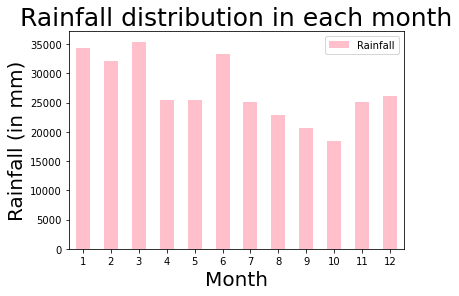

In [14]:
# Rainfall distribution in each month
Data['Date'] = pd.to_datetime(Data['Date'])
# Create a new dataframe rain_df
rainfall =[Data['Date'].dt.year, Data['Date'].dt.month, Data['Rainfall']]
headers = ['Year', 'Month', 'Rainfall']
rain_df = pd.concat(rainfall, axis=1, keys=headers)

plt.figure(figsize=(8,4))
a = rain_df.groupby('Month').agg({'Rainfall':'sum'})
a.plot(kind='bar', color='pink')
plt.title('Rainfall distribution in each month', fontsize=25)
plt.xlabel('Month', fontsize=20)
plt.ylabel('Rainfall (in mm)', fontsize=20)
plt.xticks(rotation=0)

In [15]:
#Droping the Date attribute as well, because it wouldnt help us in the analysis.

Data.drop(labels = "Date", axis = 1, inplace = True)

In [16]:
#Dividing the data into numerical and categorical.

categorical_data = [var for var in Data.columns if Data[var].dtype=='O']

numerical_data = [var for var in Data.columns if Data[var].dtype=='float']

In [17]:
categorical_data

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [18]:
numerical_data

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [19]:
for i in numerical_data:
    Data[i].fillna(value = Data[i].mean(),inplace = True)

In [20]:
Data.isnull().sum()

Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir      6966
WindGustSpeed       0
WindDir9am       8185
WindDir3pm       1239
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am         0
Pressure3pm         0
Cloud9am            0
Cloud3pm            0
Temp9am             0
Temp3pm             0
RainToday        1886
RainTomorrow     2029
dtype: int64

In [21]:
Data["WindGustDir"].value_counts(sort = True)

W      9816
SE     9369
N      9151
E      9111
SSE    9095
S      9023
WSW    8964
SW     8889
SSW    8665
WNW    8180
NW     8049
ENE    8036
ESE    7321
NE     7086
NNW    6577
NNE    6481
Name: WindGustDir, dtype: int64

In [22]:
Data["WindDir9am"].value_counts(sort = True)

N      11505
SE      9110
E       9087
SSE     9029
S       8536
NW      8443
W       8283
SW      8207
NNE     8041
NNW     7884
ENE     7760
ESE     7566
NE      7501
SSW     7445
WNW     7314
WSW     6883
Name: WindDir9am, dtype: int64

In [23]:
Data["WindDir3pm"].value_counts(sort = True)

SE     10710
W       9962
S       9741
WSW     9402
SSE     9270
SW      9263
N       8766
WNW     8740
NW      8498
ESE     8435
E       8391
NE      8197
SSW     8095
NNW     7800
ENE     7768
NNE     6502
Name: WindDir3pm, dtype: int64

In [24]:
Data["RainToday"].value_counts(sort = True)

No     107909
Yes     30984
Name: RainToday, dtype: int64

In [25]:
Data["RainTomorrow"].value_counts(sort = True)

No     107837
Yes     30913
Name: RainTomorrow, dtype: int64

In [26]:
#replacing the missing values of the categorical attributes by their mode

Data["WindGustDir"].fillna(value = "W",inplace = True)
Data["WindDir9am"].fillna(value = "N",inplace = True)
Data["WindDir3pm"].fillna(value = "SE",inplace = True)
Data["RainToday"].fillna(value = "No",inplace = True)
Data["RainTomorrow"].fillna(value = "No",inplace = True)

In [27]:
Data.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

EXPLORATORY DATA ANALYSIS

DETECTING OUTLIERS

Text(0, 0.5, 'Temp3pm')

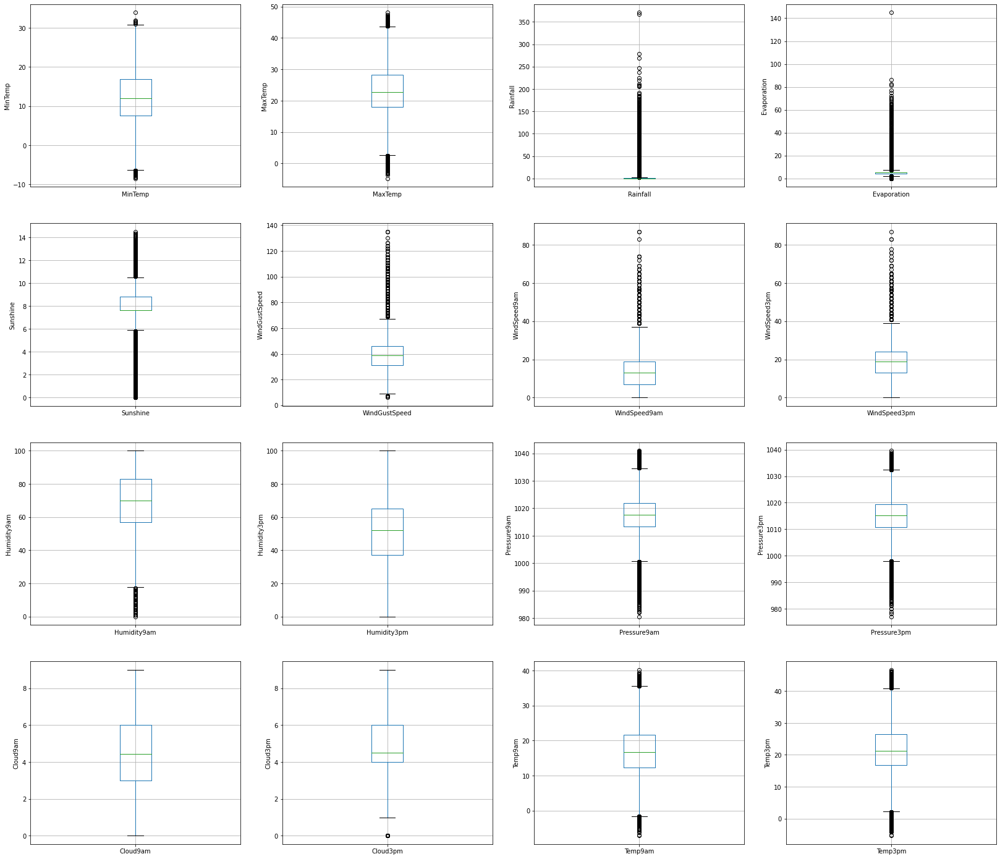

In [28]:
plt.figure(figsize=(28,25))

plt.subplot(4, 4, 1)
fig = Data.boxplot(column='MinTemp')
fig.set_ylabel('MinTemp')

plt.subplot(4, 4, 2)
fig = Data.boxplot(column='MaxTemp')
fig.set_ylabel('MaxTemp')

plt.subplot(4, 4, 3)
fig = Data.boxplot(column='Rainfall')
fig.set_ylabel('Rainfall')

plt.subplot(4, 4, 4)
fig = Data.boxplot(column='Evaporation')
fig.set_ylabel('Evaporation')

plt.subplot(4, 4, 5)
fig = Data.boxplot(column='Sunshine')
fig.set_ylabel('Sunshine')

plt.subplot(4, 4, 6)
fig = Data.boxplot(column='WindGustSpeed')
fig.set_ylabel('WindGustSpeed')

plt.subplot(4, 4, 7)
fig = Data.boxplot(column='WindSpeed9am')
fig.set_ylabel('WindSpeed9am')

plt.subplot(4, 4, 8)
fig = Data.boxplot(column='WindSpeed3pm')
fig.set_ylabel('WindSpeed3pm')

plt.subplot(4, 4, 9)
fig = Data.boxplot(column='Humidity9am')
fig.set_ylabel('Humidity9am')

plt.subplot(4, 4, 10)
fig = Data.boxplot(column='Humidity3pm')
fig.set_ylabel('Humidity3pm')

plt.subplot(4, 4, 11)
fig = Data.boxplot(column='Pressure9am')
fig.set_ylabel('Pressure9am')

plt.subplot(4, 4, 12)
fig = Data.boxplot(column='Pressure3pm')
fig.set_ylabel('Pressure3pm')

plt.subplot(4, 4, 13)
fig = Data.boxplot(column='Cloud9am')
fig.set_ylabel('Cloud9am')

plt.subplot(4, 4, 14)
fig = Data.boxplot(column='Cloud3pm')
fig.set_ylabel('Cloud3pm')

plt.subplot(4, 4, 15)
fig = Data.boxplot(column='Temp9am')
fig.set_ylabel('Temp9am')

plt.subplot(4, 4, 16)
fig = Data.boxplot(column='Temp3pm')
fig.set_ylabel('Temp3pm')

REMOVING OUTLIERS

In [29]:
#Calculating the Z-Score of the attributes that have missing values.

Data["z_MinTemp"] = (Data.MinTemp - Data.MinTemp.mean())/Data.MinTemp.std()
Data["z_MaxTemp"] = (Data.MaxTemp - Data.MaxTemp.mean())/Data.MaxTemp.std()
Data["z_Rainfall"] = (Data.Rainfall - Data.Rainfall.mean())/Data.Rainfall.std()
Data["z_Evaporation"] = (Data.Evaporation - Data.Evaporation.mean())/Data.Evaporation.std()
Data["z_Sunshine"] = (Data.Sunshine - Data.Sunshine.mean())/Data.Sunshine.std()
Data["z_WindGustSpeed"] = (Data.WindGustSpeed - Data.WindGustSpeed.mean())/Data.WindGustSpeed.std()
Data["z_WindSpeed9am"] = (Data.WindSpeed9am - Data.WindSpeed9am.mean())/Data.WindSpeed9am.std()
Data["z_WindSpeed3pm"] = (Data.WindSpeed3pm - Data.WindSpeed3pm.mean())/Data.WindSpeed3pm.std()
Data["z_Humidity9am"] = (Data.Humidity9am - Data.Humidity9am.mean())/Data.Humidity9am.std()
Data["z_Pressure9am"] = (Data.Pressure9am - Data.Pressure9am.mean())/Data.Pressure9am.std()
Data["z_Pressure3pm"] = (Data.Pressure3pm - Data.Pressure3pm.mean())/Data.Pressure3pm.std()
Data["z_Temp9am"] = (Data.Temp9am - Data.Temp9am.mean())/Data.Temp9am.std()
Data["z_Temp3pm"] = (Data.Temp3pm - Data.Temp3pm.mean())/Data.Temp3pm.std()

In [30]:
cleaned_data = Data[((Data.z_MinTemp >-2) & (Data.z_MinTemp <2))&
                   ((Data.z_MaxTemp >-2) & (Data.z_MaxTemp <2))&
                   ((Data.z_Rainfall >-2) & (Data.z_Rainfall <2))&
                   ((Data.z_Evaporation >-2) & (Data.z_Evaporation <2))&
                   ((Data.z_Sunshine >-2) & (Data.z_Sunshine <2))&
                   ((Data.z_WindGustSpeed >-2) & (Data.z_WindGustSpeed <2))&
                   ((Data.z_WindSpeed9am >-2) & (Data.z_WindSpeed9am <2))&
                    ((Data.z_WindSpeed3pm >-2) & (Data.z_WindSpeed3pm <2))&
                   ((Data.z_Humidity9am >-2) & (Data.z_Humidity9am <2))&
                   ((Data.z_Pressure9am >-2) & (Data.z_Pressure9am <2))&
                   ((Data.z_Pressure3pm >-2) & (Data.z_Pressure3pm <2))&
                   ((Data.z_Temp9am >-2) & (Data.z_Temp9am <2))&
                   ((Data.z_Temp3pm >-2) & (Data.z_Temp3pm <2))]

In [31]:
cleaned_data.drop(labels = "z_MinTemp", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_MaxTemp", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_Rainfall", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_Evaporation", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_Sunshine", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_WindGustSpeed", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_WindSpeed9am", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_WindSpeed3pm", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_Humidity9am", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_Pressure9am", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_Pressure3pm", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_Temp9am", axis = 1, inplace = True)
cleaned_data.drop(labels = "z_Temp3pm", axis = 1, inplace = True)

In [32]:
#The shape of our dataset after removing the outliers.
cleaned_data.shape

(96999, 22)

Text(0, 0.5, 'Temp3pm')

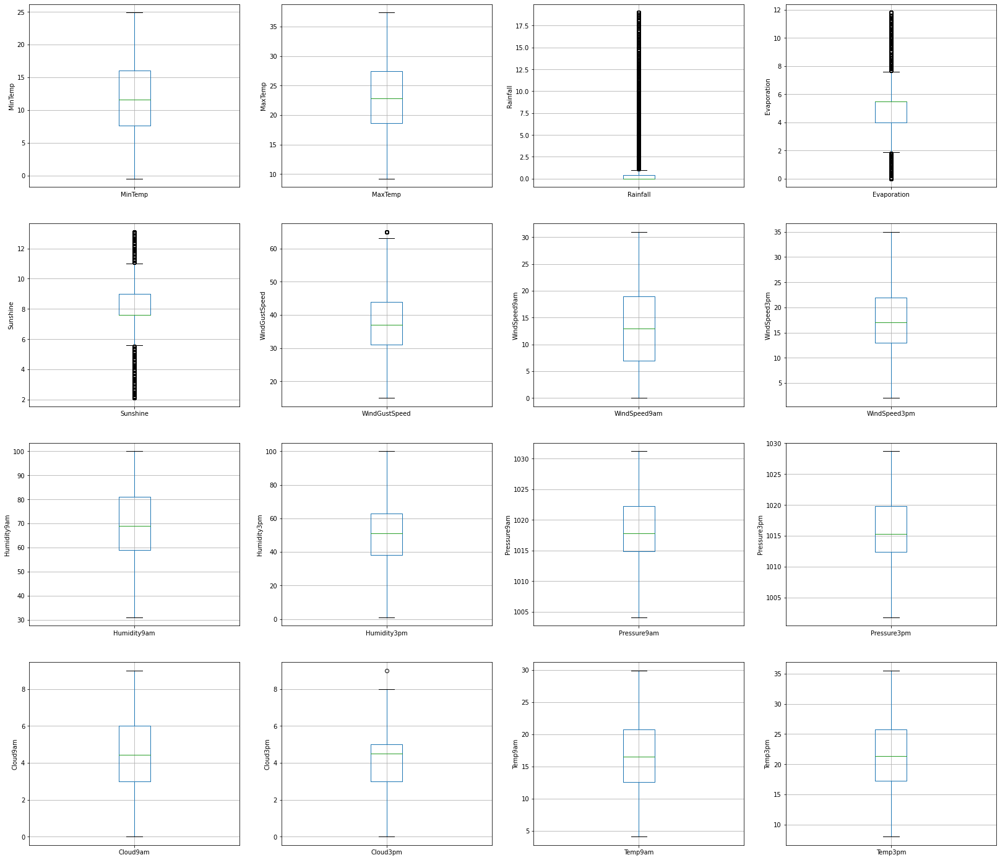

In [33]:
plt.figure(figsize=(28,25))

plt.subplot(4, 4, 1)
fig = cleaned_data.boxplot(column='MinTemp')
fig.set_ylabel('MinTemp')

plt.subplot(4, 4, 2)
fig = cleaned_data.boxplot(column='MaxTemp')
fig.set_ylabel('MaxTemp')

plt.subplot(4, 4, 3)
fig = cleaned_data.boxplot(column='Rainfall')
fig.set_ylabel('Rainfall')

plt.subplot(4, 4, 4)
fig = cleaned_data.boxplot(column='Evaporation')
fig.set_ylabel('Evaporation')

plt.subplot(4, 4, 5)
fig = cleaned_data.boxplot(column='Sunshine')
fig.set_ylabel('Sunshine')

plt.subplot(4, 4, 6)
fig = cleaned_data.boxplot(column='WindGustSpeed')
fig.set_ylabel('WindGustSpeed')

plt.subplot(4, 4, 7)
fig = cleaned_data.boxplot(column='WindSpeed9am')
fig.set_ylabel('WindSpeed9am')

plt.subplot(4, 4, 8)
fig = cleaned_data.boxplot(column='WindSpeed3pm')
fig.set_ylabel('WindSpeed3pm')

plt.subplot(4, 4, 9)
fig = cleaned_data.boxplot(column='Humidity9am')
fig.set_ylabel('Humidity9am')

plt.subplot(4, 4, 10)
fig = cleaned_data.boxplot(column='Humidity3pm')
fig.set_ylabel('Humidity3pm')

plt.subplot(4, 4, 11)
fig = cleaned_data.boxplot(column='Pressure9am')
fig.set_ylabel('Pressure9am')

plt.subplot(4, 4, 12)
fig = cleaned_data.boxplot(column='Pressure3pm')
fig.set_ylabel('Pressure3pm')

plt.subplot(4, 4, 13)
fig = cleaned_data.boxplot(column='Cloud9am')
fig.set_ylabel('Cloud9am')

plt.subplot(4, 4, 14)
fig = cleaned_data.boxplot(column='Cloud3pm')
fig.set_ylabel('Cloud3pm')

plt.subplot(4, 4, 15)
fig = cleaned_data.boxplot(column='Temp9am')
fig.set_ylabel('Temp9am')

plt.subplot(4, 4, 16)
fig = cleaned_data.boxplot(column='Temp3pm')
fig.set_ylabel('Temp3pm')



CORRELATION ANALYSIS

<AxesSubplot:>

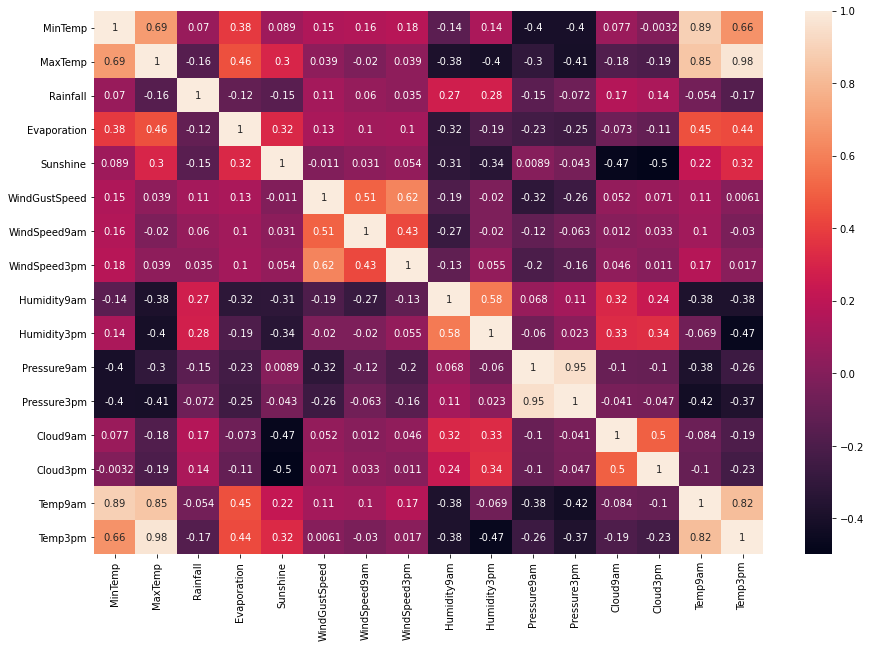

In [34]:
plt.figure(figsize = (15,10))
sns.heatmap(cleaned_data.corr(), annot = True)

In [35]:
cleaned_data.drop(labels = ["Temp9am", "Temp3pm", "Pressure3pm"], axis = 1, inplace = True)

In [36]:
cleaned_data.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Cloud9am', 'Cloud3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [37]:
cleaned_data['RainToday'].replace({'No': 0, 'Yes': 1},inplace = True)
cleaned_data['RainTomorrow'].replace({'No': 0, 'Yes': 1},inplace = True)

In [38]:
cleaned_data.head(2)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,5.466568,7.616019,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,8.000000,4.507211,0,0
1,Albury,7.4,25.1,0.0,5.466568,7.616019,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,4.444563,4.507211,0,0


In [39]:
import plotly.express as px

In [40]:
px.histogram(cleaned_data,
             x='Location',
             title='Location wise rainfall prediction',
             color='RainToday')

In [41]:
px.scatter(cleaned_data.sample(1000),
           title='Lowest Temp vs Highest Temp',
           color='RainToday',
           x='MinTemp',
           y='MaxTemp')

#place the cursor at any point to check values

<Figure size 7200x7200 with 0 Axes>

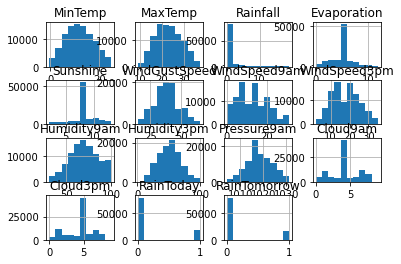

In [46]:
plt.figure(figsize = (100,100))
cleaned_data.hist()
plt.show()

<AxesSubplot:ylabel='None'>

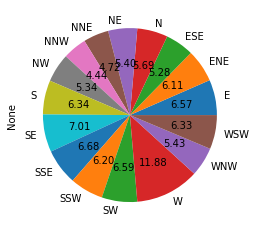

In [47]:
cleaned_data.groupby("WindGustDir").size().plot(kind='pie', autopct='%.2f')

In [48]:
categorical_data

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

<AxesSubplot:ylabel='None'>

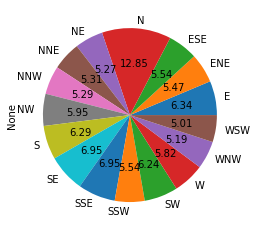

In [49]:
cleaned_data.groupby("WindDir9am").size().plot(kind='pie', autopct='%.2f')

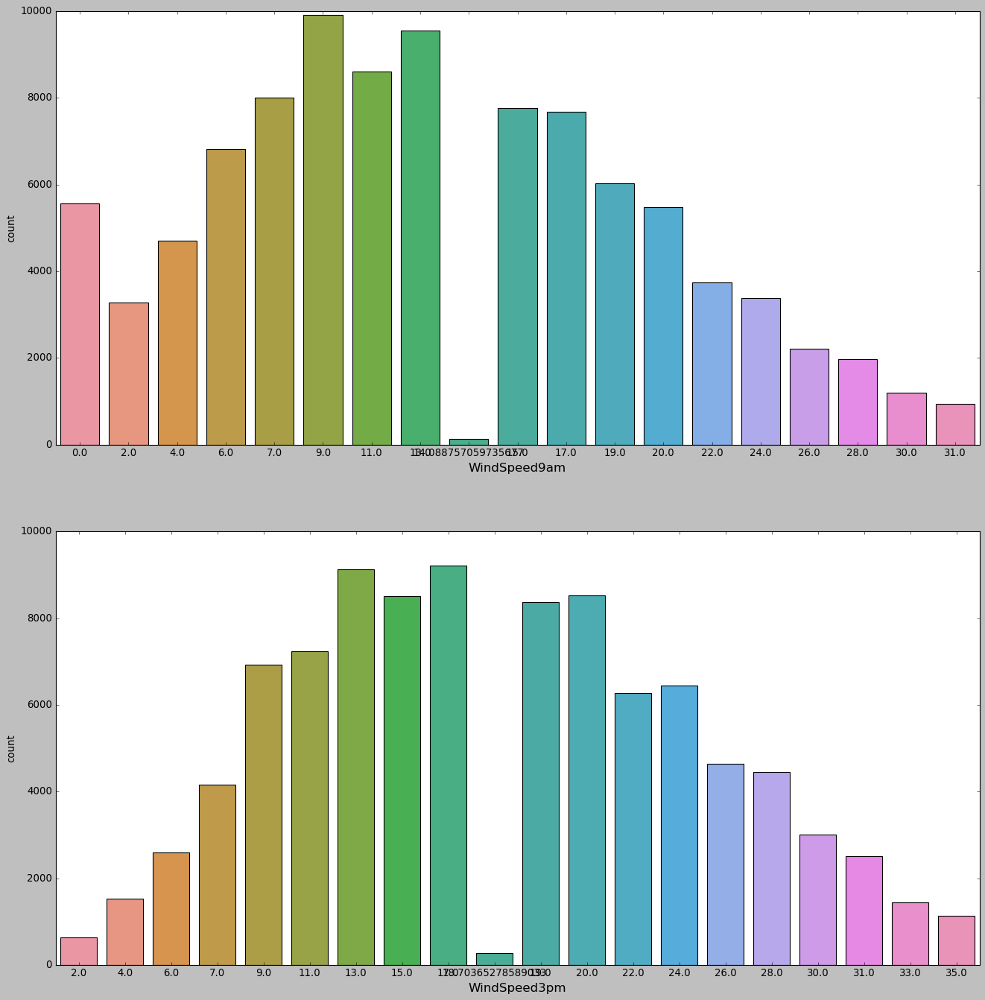

In [50]:
plt.style.use("classic")
fig, ax =plt.subplots(2,1, figsize=(20,20))

sns.countplot(cleaned_data['WindSpeed9am'], ax=ax[0])
ax[0].set_xlabel("WindSpeed9am",fontsize=15)

sns.countplot(cleaned_data['WindSpeed3pm'], ax=ax[1])
ax[1].set_xlabel("WindSpeed3pm",fontsize=15);

Wind speed at 9am is usually around 9km/hr

Wind speed at 3pm is usually around 17km/hr

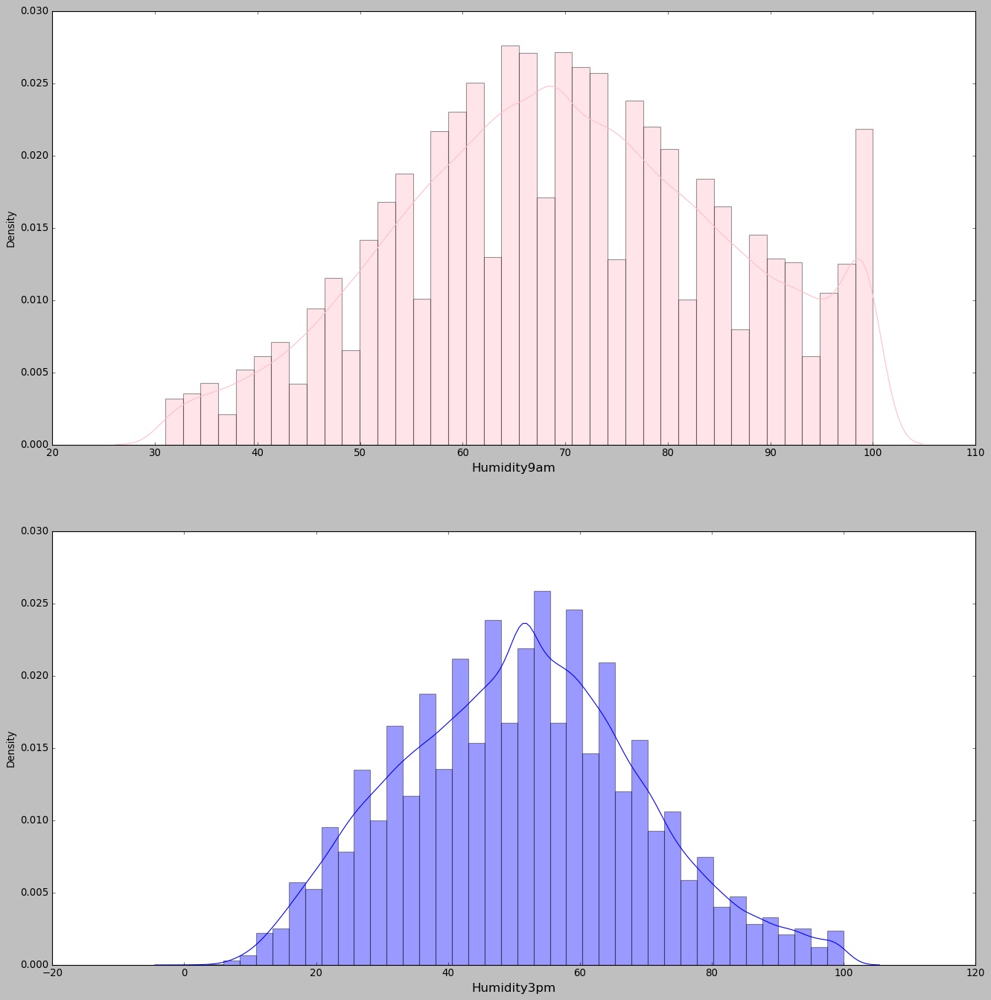

In [51]:
plt.style.use("classic")
fig, ax =plt.subplots(2,1, figsize=(20,20))

sns.distplot(cleaned_data['Humidity9am'], ax=ax[0], color="pink", bins=40)
ax[0].set_xlabel("Humidity9am",fontsize=15)

sns.distplot(cleaned_data['Humidity3pm'], ax=ax[1], color="blue", bins=40);
ax[1].set_xlabel("Humidity3pm",fontsize=15);

In [52]:
x = cleaned_data.iloc[:,:-1]
y = cleaned_data.iloc[:,-1]

In [53]:
x.head(2)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday
0,Albury,13.4,22.9,0.6,5.466568,7.616019,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,8.000000,4.507211,0
1,Albury,7.4,25.1,0.0,5.466568,7.616019,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,4.444563,4.507211,0


In [54]:
y.head(2)

0    0
1    0
Name: RainTomorrow, dtype: int64

In [55]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size = 0.3, random_state = 101)

In [56]:
print (x.shape, X_train.shape, X_test.shape, y.shape,Y_train.shape, Y_test.shape )

(96999, 18) (67899, 18) (29100, 18) (96999,) (67899,) (29100,)


DUMMY VARIBALE ENCODING

In [57]:
X_train_dummy = pd.get_dummies(X_train,columns = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm'],drop_first=True)
X_test_dummy = pd.get_dummies(X_test,columns = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm'],drop_first=True)

In [58]:
X_train_dummy.head(2)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
56683,0.1,15.7,0.0,5.466568,7.616019,20.0,0.0,9.0,99.0,47.0,1025.0,4.444563,4.507211,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
44795,12.5,18.1,6.6,5.466568,7.616019,57.0,19.0,30.0,78.0,73.0,1007.7,8.000000,8.000000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [59]:
X_test_dummy.head(2)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
94240,14.3,28.7,0.0,6.000000,9.400000,35.0,24.0,15.0,47.0,24.0,1018.400000,1.000000,1.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
125369,6.8,18.9,0.0,5.466568,7.616019,28.0,13.0,15.0,65.0,60.0,1017.648376,4.444563,4.507211,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [60]:
print (X_train_dummy.shape, X_test_dummy.shape)

(67899, 107) (29100, 107)


NORMALIZATION

In [61]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

norm_X_train_dummy = scaler.fit_transform(X_train_dummy)
norm_X_test_dummy = scaler.transform(X_test_dummy)

In [62]:
Y_train.value_counts()

0    55862
1    12037
Name: RainTomorrow, dtype: int64

<AxesSubplot:>

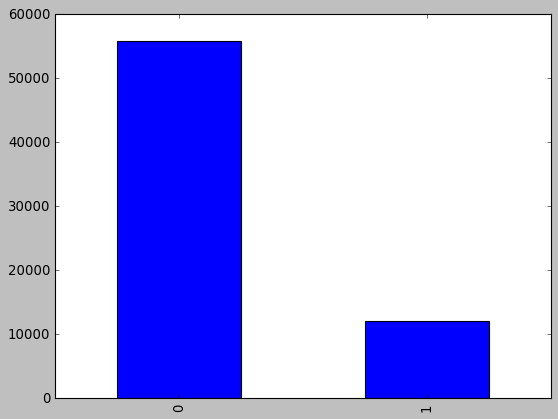

In [63]:
Y_train.value_counts().plot(kind = 'bar')

BALANCING OUR TARGET VARIABLE THROUGH OVER SAMPLING

In [64]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=888)
X_train_resampled, Y_train_resampled = smote.fit_resample(norm_X_train_dummy, Y_train)

CHECKING IF OUR TARGET VARIABLE IS BALANCED OR NOT

In [65]:
Y_train_resampled.value_counts()

1    55862
0    55862
Name: RainTomorrow, dtype: int64

<AxesSubplot:>

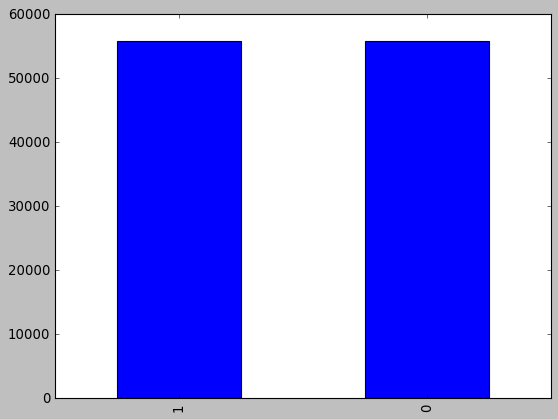

In [66]:
Y_train_resampled.value_counts().plot(kind = 'bar')

DIFFERENT MACHINE LEARNING MODELS

In [67]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn import metrics

MODEL 1 - LOGISTIC REGRESSION

In [68]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X_train_resampled, Y_train_resampled)
prediction_lr = lr.predict(norm_X_test_dummy)
print ("Accuracy of the Logistic Regression is : ", accuracy_score(Y_test, prediction_lr)*100,"%")
print ('RMSE of the Logistic Regression is:', np.sqrt(metrics.mean_squared_error(Y_test, prediction_lr)))

Accuracy of the Logistic Regression is :  77.18213058419245 %
RMSE of the Logistic Regression is: 0.477680535670102


In [69]:
confusion_matrix(Y_test, prediction_lr)

array([[18711,  5271],
       [ 1369,  3749]], dtype=int64)

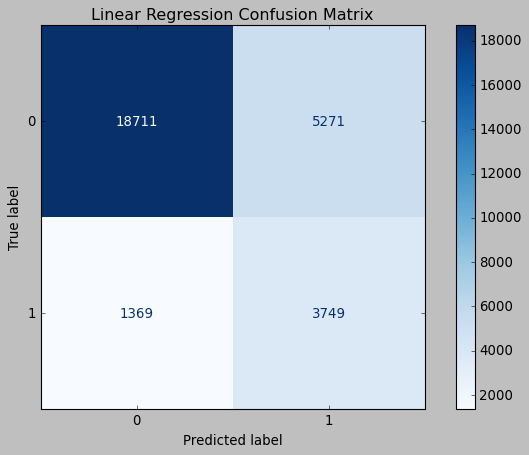

In [70]:
matrix_lr = plot_confusion_matrix(lr, norm_X_test_dummy, Y_test, cmap=plt.cm.Blues)
matrix_lr.ax_.set_title("Linear Regression Confusion Matrix")
plt.gcf().set_size_inches(10,6)

In [71]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()
dt.fit(X_train_resampled, Y_train_resampled)
prediction_dt = dt.predict(norm_X_test_dummy)
print ("Accuracy of the Decision Tree Classifier is : ", accuracy_score(Y_test, prediction_dt)*100,"%")
print ('RMSE of the Decision Tree Classifier is :', np.sqrt(metrics.mean_squared_error(Y_test, prediction_dt)))

Accuracy of the Decision Tree Classifier is :  78.23711340206185 %
RMSE of the Decision Tree Classifier is : 0.46650709102797294


In [72]:
confusion_matrix(Y_test, prediction_dt)

array([[20315,  3667],
       [ 2666,  2452]], dtype=int64)

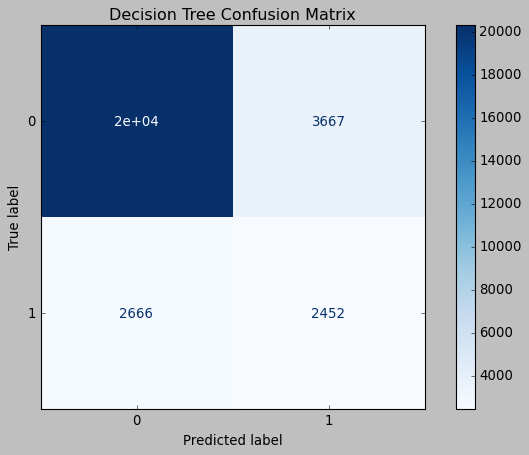

In [73]:
matrix_lr = plot_confusion_matrix(dt, norm_X_test_dummy, Y_test, cmap=plt.cm.Blues)
matrix_lr.ax_.set_title("Decision Tree Confusion Matrix")
plt.gcf().set_size_inches(10,6)

MODEL 3 - RANDOM FOREST CLASSIFIER

In [74]:
from sklearn.ensemble import RandomForestClassifier

rc = RandomForestClassifier()
rc.fit(X_train_resampled, Y_train_resampled)
prediction_rc = rc.predict(norm_X_test_dummy)
print ("Accuracy of the Random Forest Classifier is : ", accuracy_score(Y_test, prediction_rc)*100,"%")
print ('RMSE of the Random Forest Classifier is :', np.sqrt(metrics.mean_squared_error(Y_test, prediction_rc)))

Accuracy of the Random Forest Classifier is :  85.18556701030928 %
RMSE of the Random Forest Classifier is : 0.38489521937393195


In [75]:
confusion_matrix(Y_test, prediction_rc)

array([[22033,  1949],
       [ 2362,  2756]], dtype=int64)

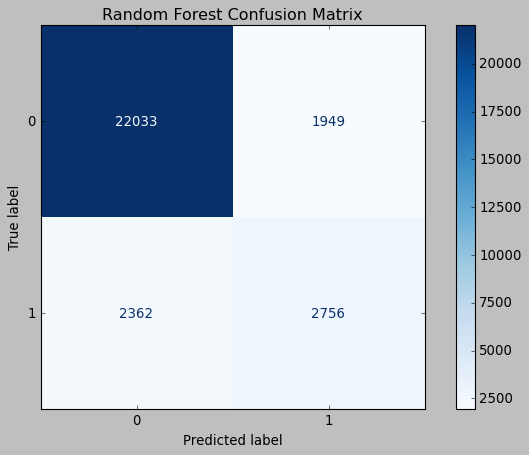

In [76]:
matrix_lr = plot_confusion_matrix(rc, norm_X_test_dummy, Y_test, cmap=plt.cm.Blues)
matrix_lr.ax_.set_title("Random Forest Confusion Matrix")
plt.gcf().set_size_inches(10,6)

MODEL 4 - K-NEAREST NEIGHBOURS

In [77]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors = 2)
knn.fit(X_train_resampled, Y_train_resampled)
prediction_knn = knn.predict(norm_X_test_dummy)
print ("Accuracy of the KNN is : ", accuracy_score(Y_test, prediction_knn)*100,"%")
print ('RMSE of the KNN is:', np.sqrt(metrics.mean_squared_error(Y_test, prediction_knn)))

Accuracy of the KNN is :  77.52920962199312 %
RMSE of the KNN is: 0.4740336525818275


In [78]:
confusion_matrix(Y_test, prediction_knn)

array([[20656,  3326],
       [ 3213,  1905]], dtype=int64)

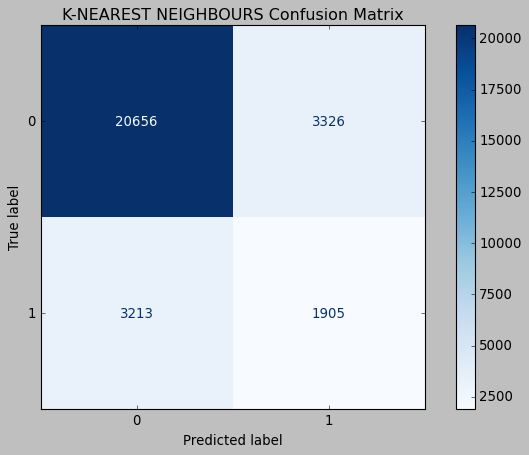

In [79]:
matrix_lr = plot_confusion_matrix(knn, norm_X_test_dummy, Y_test, cmap=plt.cm.Blues)
matrix_lr.ax_.set_title("K-NEAREST NEIGHBOURS Confusion Matrix")
plt.gcf().set_size_inches(10,6)

In [80]:
import xgboost as xgb

xg_class = xgb.XGBClassifier()
xg_class.fit(X_train_resampled, Y_train_resampled)
prediction_xg = xg_class.predict(norm_X_test_dummy)
print ("Accuracy of the XGBoost classifier is : ", accuracy_score(Y_test, prediction_xg),"%")
print ('RMSE of the XGBoost classifier is:', np.sqrt(metrics.mean_squared_error(Y_test, prediction_xg)))

[09:24:40] WARNING: D:\bld\xgboost-split_1634712635879\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy of the XGBoost classifier is :  0.8630584192439863 %
RMSE of the XGBoost classifier is: 0.37005618594480183


In [81]:
confusion_matrix(Y_test, prediction_xg)

array([[22840,  1142],
       [ 2843,  2275]], dtype=int64)

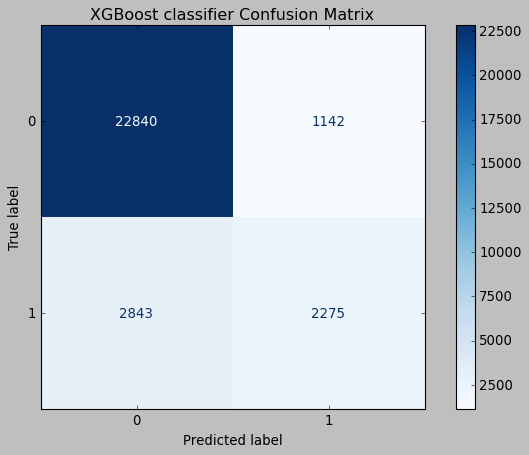

In [82]:
matrix_lr = plot_confusion_matrix(xg_class, norm_X_test_dummy, Y_test, cmap=plt.cm.Blues)
matrix_lr.ax_.set_title("XGBoost classifier Confusion Matrix")
plt.gcf().set_size_inches(10,6)